### Laboratorium 7 - zadania

W pakiecie OpenCV wszystkie zadania związane z detekcją i opisem punktów kluczowych realizowane są przez zestaw specjalnych klas, dla których bazową jest `cv::Feature2D`. Jedną z wielu pochodnych tej klasy jest interesująca nas na zajęciach `cv::SIFT`, z której dokumentacją należy się zapoznać.  
Najważniejsze, co trzeba wiedzieć:
1. do konstrukcji obiektu SIFT służy metoda [`cv2.SIFT_create`](https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131) - to do niej przekazujemy parametry detektora (w dokumentacji występuje jako `cv::SIFT::create`);
2. obsługujemy detektor przez interfejs `cv::Feature2D`, konkretnie metody [`detect`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887) do detekcji punktów kluczowych oraz [`compute`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#ab3cce8d56f4fc5e1d530b5931e1e8dc0) do obliczania ich deskryptorów (opcjonalnie `detectAndCompute`).

Schemat użycia:
```python
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
```

`keypoints` jest listą obiektów specjalnego typu `cv2.KeyPoint`, która **jest modyfikowana** przez `SIFT::compute`!  
`descriptors` jest natomiast macierzą float32 o wymiarach NxK, gdzie N jest liczbą punktów kluczowych, a K jest liczbą obliczonych cech.

Warto również zapoznać się z funkcją [`cv2.drawKeypoints`](https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) w kontekście prezentacji wyników. Zwróć uwagę na flagi sterujące rysowaniem - szczególnie użyteczna jest `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

In [56]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

#### Zadanie 1 (1.0 pkt | 0.75 pkt)

Przetestuj wpływ podstawowych parametrów detektora SIFT (`contrastThreshold` i `edgeThreshold`) na uzyskiwane punkty kluczowe (liczność, lokalizacja, rozmiar), korzystając z obrazów `cells` i `lena`. Pamiętaj że ich działanie jest odwrotne (tzn. jeden odsiewa cechy "mniejsze niż", a drugi "większe niż").

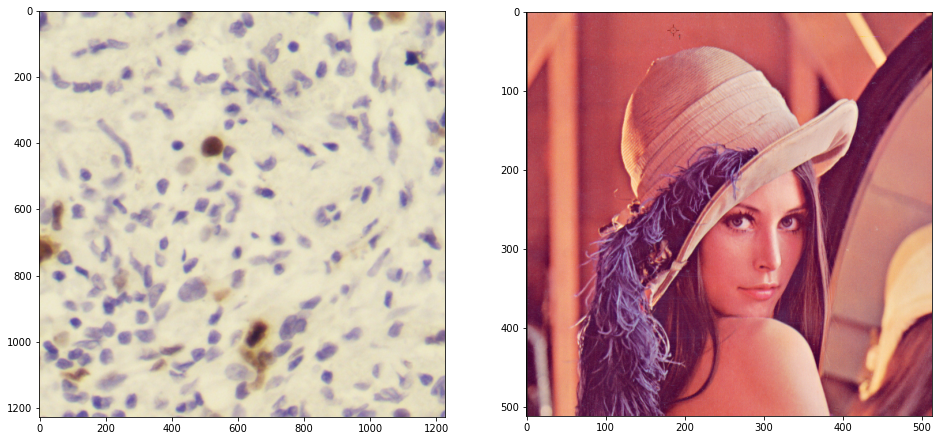

In [3]:
cells = cv2.imread('p1_0308_7.jpg')
lena = cv2.imread('Lena.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(cells[..., ::-1]);
a2.imshow(lena[..., ::-1]);

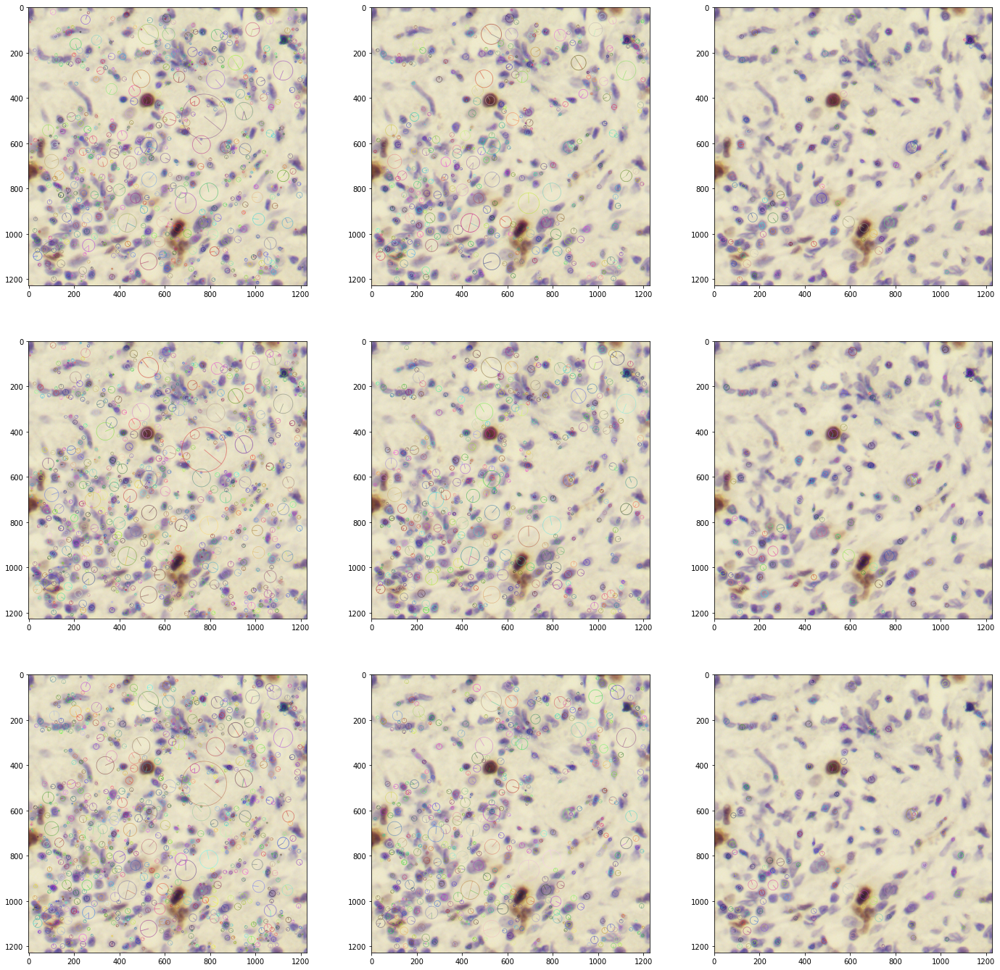

In [44]:
image = cells

edges = [5, 10, 15]
contrasts = [0.02, 0.04, 0.08]

f, axs = plt.subplots(3, 3, figsize=(24, 24))

for i in range(len(edges)):
    for j in range(len(contrasts)):
        sift_instance = cv2.SIFT_create(edgeThreshold=edges[i], contrastThreshold=contrasts[j])
        # 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
        keypoints = sift_instance.detect(image)
        keypoints, descriptors = sift_instance.compute(image, keypoints)
        image_keys = cv2.drawKeypoints(image[..., ::-1], keypoints, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axs[i][j].imshow(image_keys);

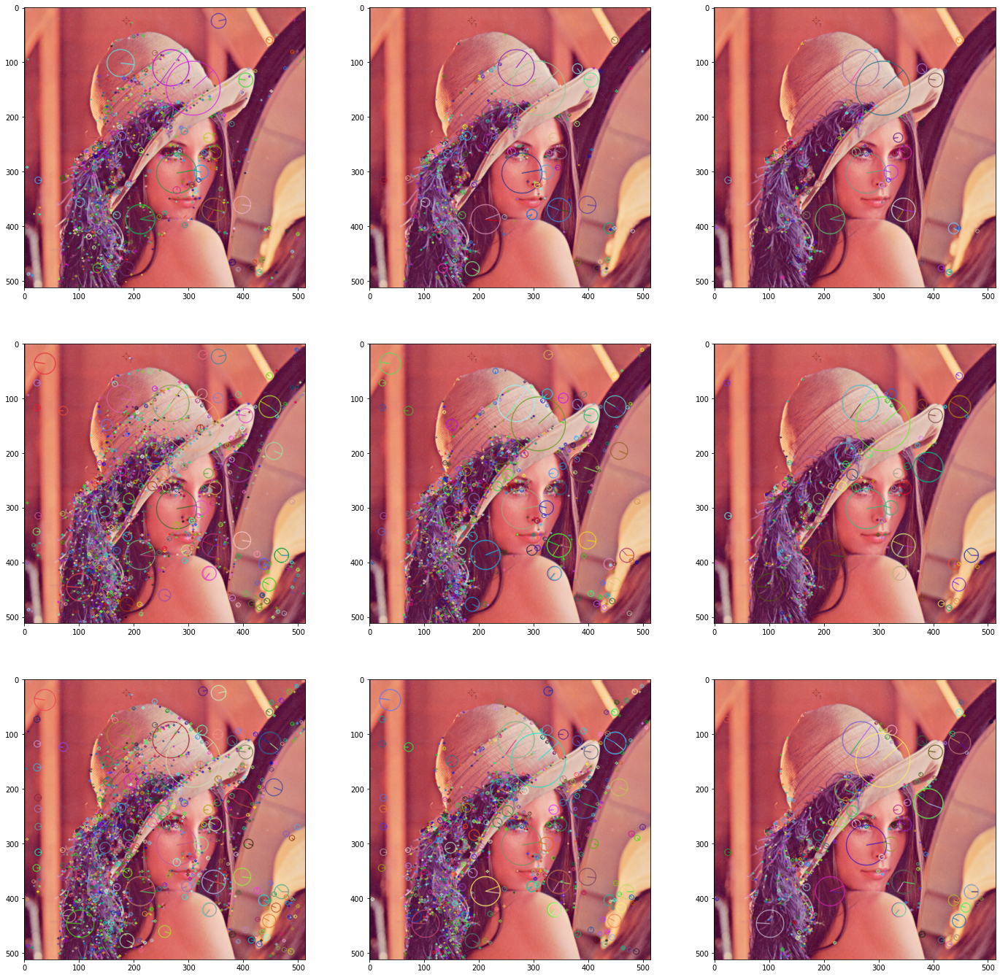

In [45]:
image = lena

edges = [5, 10, 15]
contrasts = [0.02, 0.04, 0.08]

f, axs = plt.subplots(3, 3, figsize=(24, 24))

for i in range(len(edges)):
    for j in range(len(contrasts)):
        sift_instance = cv2.SIFT_create(edgeThreshold=edges[i], contrastThreshold=contrasts[j])
        # 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
        keypoints = sift_instance.detect(image)
        keypoints, descriptors = sift_instance.compute(image, keypoints)
        image_keys = cv2.drawKeypoints(image[..., ::-1], keypoints, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axs[i][j].imshow(image_keys);

#### Zadanie 2 (1.0 pkt | 0.75 pkt)

Detektor SIFT jest w teorii niezmienniczy względem translacji, rotacji czy zmiany skali. Przetestuj te własności w praktyce, oceniając wizualnie stabilność punktów wykrywanych na obróconej i przeskalowanej wersji obrazów `cells` i `lena`.

In [47]:
def rotate(image, angle, scale=1.0):
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

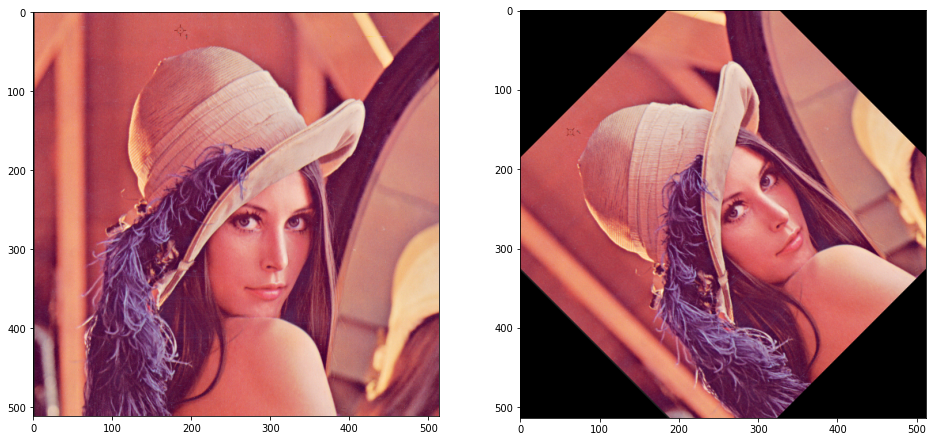

In [48]:
lena_rot = rotate(lena, 45.0, scale=0.9)
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(lena[..., ::-1]);
a2.imshow(lena_rot[..., ::-1]);

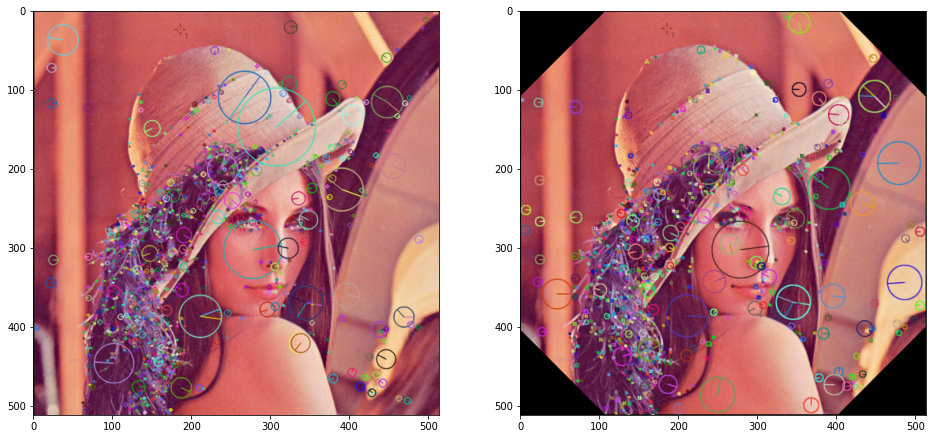

In [49]:
image = lena

sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
image_keys = cv2.drawKeypoints(image[..., ::-1], keypoints, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

image = lena_rot

sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
image_keys_rot = cv2.drawKeypoints(image[..., ::-1], keypoints, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(image_keys);
a2.imshow(rotate(image_keys_rot, -45., scale=1/0.9));

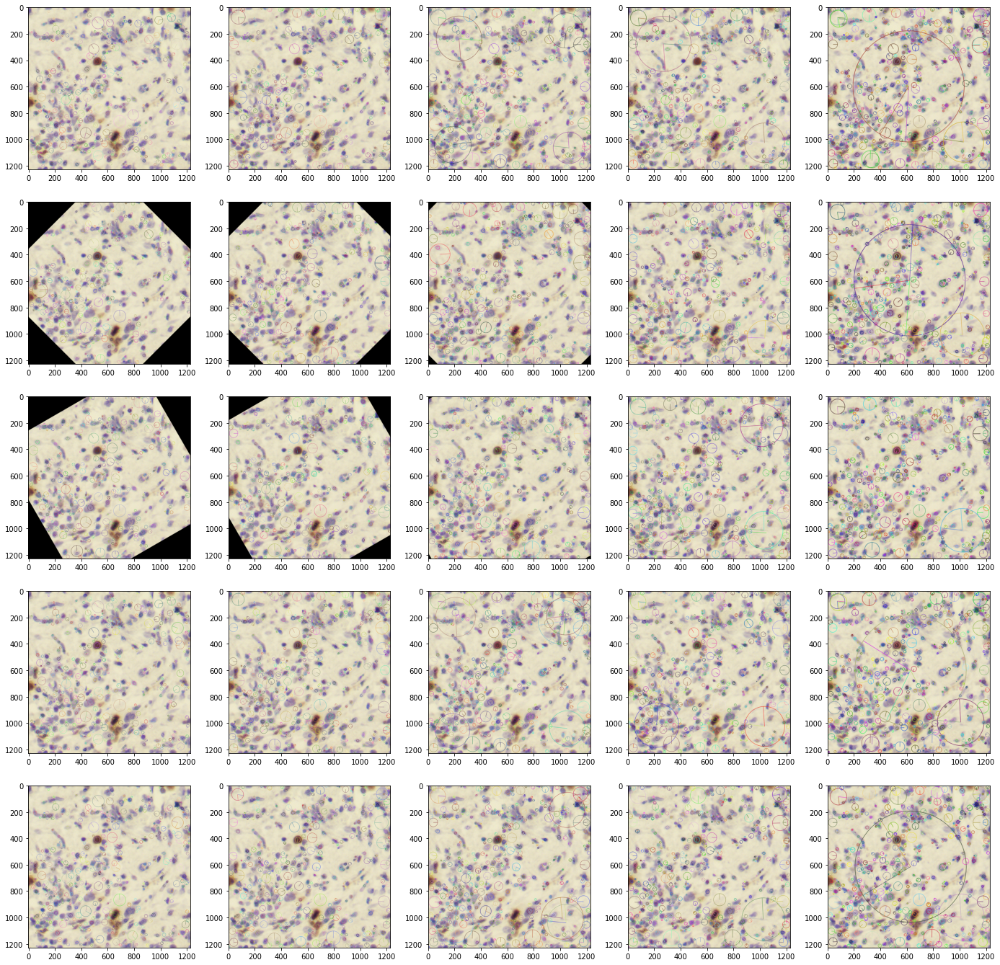

In [50]:
image = cells

rotations = [0., 45., 60., 90., 180.]
scales = [1., 0.9, 0.75, 2/3, 0.5]

f, axs = plt.subplots(5, 5, figsize=(24, 24))

for i in range(len(rotations)):
    for j in range(len(scales)):
        image_mod = rotate(image, rotations[i], scales[j])
        sift_instance = cv2.SIFT_create()
        # 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
        keypoints = sift_instance.detect(image_mod)
        keypoints, descriptors = sift_instance.compute(image_mod, keypoints)
        image_keys = cv2.drawKeypoints(image_mod[..., ::-1], keypoints, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axs[i][j].imshow(rotate(image_keys, -rotations[i], 1/scales[j]));

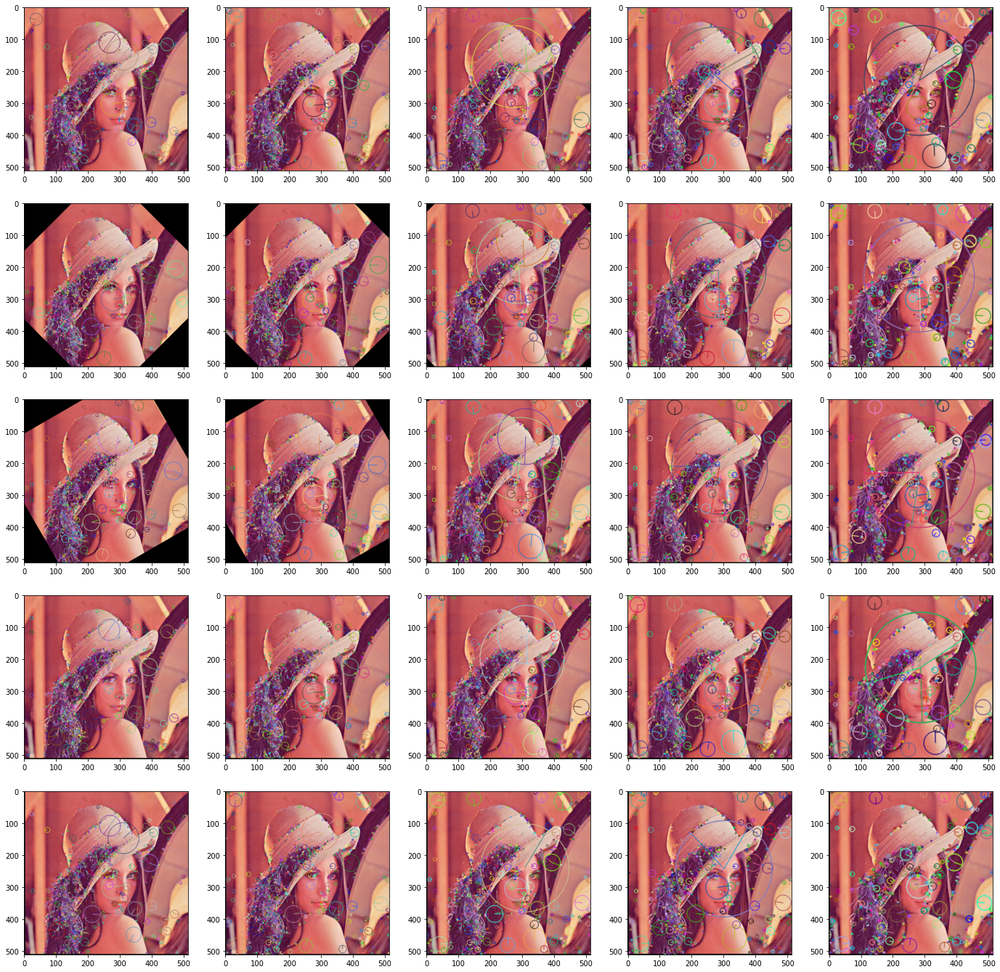

In [51]:
image = lena

rotations = [0., 45., 60., 90., 180.]
scales = [1., 0.9, 0.75, 2/3, 0.5]

f, axs = plt.subplots(5, 5, figsize=(24, 24))

for i in range(len(rotations)):
    for j in range(len(scales)):
        image_mod = rotate(image, rotations[i], scales[j])
        sift_instance = cv2.SIFT_create()
        # 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
        keypoints = sift_instance.detect(image_mod)
        keypoints, descriptors = sift_instance.compute(image_mod, keypoints)
        image_keys = cv2.drawKeypoints(image_mod[..., ::-1], keypoints, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axs[i][j].imshow(rotate(image_keys, -rotations[i], 1/scales[j]));

#### Zadanie 3 (1.0 pkt | 0.5 pkt)

Celem tego zadania jest wykrycie punktów zainteresowania odpowiadających jak najbardziej komórkom znajdującym się na obrazie `cells` (tło nie niesie informacji). Wykonaj detekcję SIFT z ustalonymi wcześniej parametrami; jaki problem dostrzegasz? Zaproponuj taki algorytm przetwarzania wstępnego dla tego obrazu, by wykrywać lepszej jakości punkty.  
Do zadania możesz podejść na dwa sposoby: albo modyfikując obraz źródłowy przed wykonaniem detekcji, albo opracowując maskę ograniczającą obszar detekcji.

_W sprawozdaniu postaraj się nie tylko opisać symptomy problemu i metodę rozwiązania go, ale zwrócić również uwagę na przyczyny wynikające z działania samego SIFT._

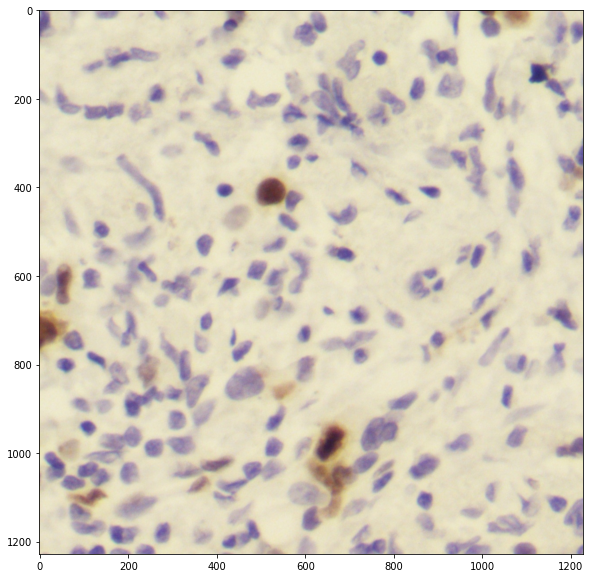

In [ ]:
cells = cv2.imread('p1_0308_7.jpg')
f, ax = plt.subplots(1, 1, figsize=(10, 10)); ax.imshow(cells[..., ::-1]);

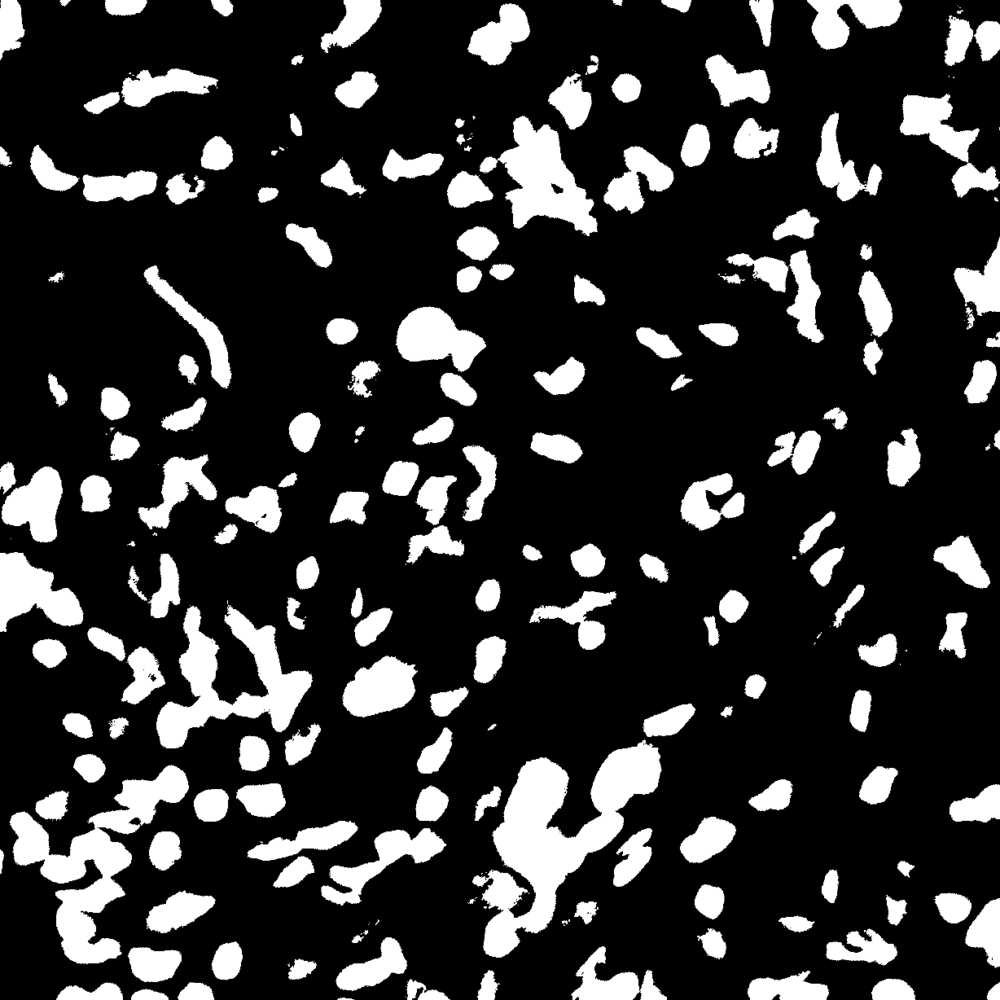

In [58]:
image = cv2.cvtColor(cells, cv2.COLOR_BGR2GRAY)
(T, img_threshInv) = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

Image.fromarray(img_threshInv)

error: OpenCV(4.5.3) C:\Users\runneradmin\AppData\Local\Temp\pip-req-build-sn_xpupm\opencv\modules\core\src\alloc.cpp:73: error: (-4:Insufficient memory) Failed to allocate 22221652224 bytes in function 'cv::OutOfMemoryError'


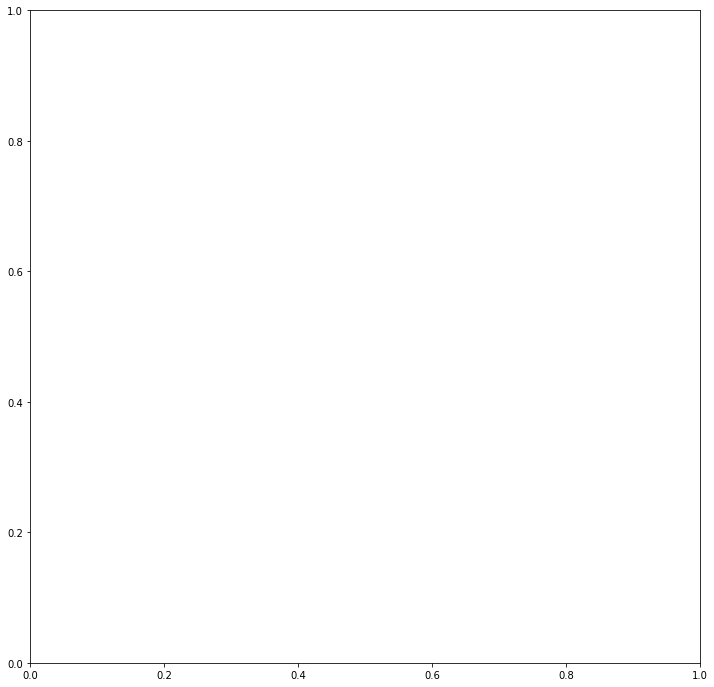

In [60]:
image = cells[img_threshInv]

f, ax = plt.subplots(1, 1, figsize=(12, 12))
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
image_keys = cv2.drawKeypoints(image[..., ::-1], keypoints, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
ax.imshow(image_keys);